# Problem Statement
Predict the risk of getting infected given day and location.  Ideally, this would be time of day and location, but granular data at that level could not be found.  Rate of community spread would be based on location.

# Loading Data

In [14]:
# load libraries
import pandas as pd
import numpy as np
import seaborn as sns
from sagemaker import get_execution_role
import matplotlib.pyplot as plt
%matplotlib inline

In [15]:
# Boto is the Amazon Web Services (AWS) SDK for Python. It enables Python developers to create, configure, and manage AWS services, such as EC2 and S3. 
# Boto provides an easy to use, object-oriented API, as well as low-level access to AWS services.
import boto3

role = get_execution_role()

Data was downloaded on 2020-07-30 from [COVID-19 community Mobility Reports](https://www.google.com/covid19/mobility/index.html?hl=en)
"The reports chart movement trends over time by geography, across different 
categories of places such as retail and recreation, groceries and pharmacies, parks, transit stations, workplaces, and residential."

"The data shows how visitors to (or time spent in) categorized places change compared to our baseline days. A baseline day represents a normal value for that day of the week. The baseline day is the median value from the 5‑week period Jan 3 – Feb 6, 2020."

In [16]:
#load data *comment this out if running in AWS*
#file_path = "https://raw.githubusercontent.com/dinhhn/wwcode-aws-hackathon/master/data/Global_Mobility_Report.csv"
#mobility_df = pd.read_csv(file_path)

In [17]:
# load data from S3
input_bucket = 'ml-social-good/covid19-hackathon/google-covid-19-reports/dataset'
in_data_key = 'google-covid-19-reports.csv'
training_data_location = 's3://{}/{}'.format(input_bucket, in_data_key)

mobility_df = pd.read_csv(training_data_location)
print('uploaded training data from location: {}'.format(training_data_location))


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


uploaded training data from location: s3://ml-social-good/covid19-hackathon/google-covid-19-reports/dataset/google-covid-19-reports.csv


COVID-19 United States Reopen and Shut Down Status by State (downloaded 2020-07-28 from AWS Data Exchange).
The included dataset offers a state-by-state overview of the current level of reopen and/or shut down as a result of the coronavirus (COVID-19) pandemic. 
Estimated state population data from the United States Census Bureau is also included.

In [18]:
#load data *comment this out if running in AWS*
#file_path = "https://raw.githubusercontent.com/dinhhn/wwcode-aws-hackathon/master/data/nyt-states-reopen-status-covid-19.csv"
#reopen_df = pd.read_csv(file_path)

In [19]:
# load data from S3
input_bucket = 'ml-social-good/covid19-hackathon/nyt-states-reopen-status-covid-19/dataset'
in_data_key = 'nyt-states-reopen-status-covid-19.csv'
training_data_location = 's3://{}/{}'.format(input_bucket, in_data_key)

reopen_df = pd.read_csv(training_data_location)
print('uploaded training data from location: {}'.format(training_data_location))

uploaded training data from location: s3://ml-social-good/covid19-hackathon/nyt-states-reopen-status-covid-19/dataset/nyt-states-reopen-status-covid-19.csv


# Data Inspection & Visualization

In [20]:
# show columns - 2 methods: keys() and columns
#mobility_df.keys()
mobility_df.columns

Index(['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2',
       'metro_area', 'iso_3166_2_code', 'census_fips_code', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline'],
      dtype='object')

In [21]:
mobility_df.dtypes

country_region_code                                    object
country_region                                         object
sub_region_1                                           object
sub_region_2                                           object
metro_area                                             object
iso_3166_2_code                                        object
census_fips_code                                      float64
date                                                   object
retail_and_recreation_percent_change_from_baseline    float64
grocery_and_pharmacy_percent_change_from_baseline     float64
parks_percent_change_from_baseline                    float64
transit_stations_percent_change_from_baseline         float64
workplaces_percent_change_from_baseline               float64
residential_percent_change_from_baseline              float64
dtype: object

In [22]:
# show first 5 rows
mobility_df.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0
2,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0
3,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-18,-2.0,1.0,5.0,0.0,2.0,1.0
4,AE,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,2020-02-19,-2.0,0.0,4.0,-1.0,2.0,1.0


In [23]:
# show last 5 rows
mobility_df.tail()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
1327804,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-07-20,NaN,NaN,NaN,NaN,-4.0,NaN
1327805,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-07-21,NaN,NaN,NaN,NaN,2.0,NaN
1327806,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-07-22,NaN,NaN,NaN,NaN,-7.0,NaN
1327807,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-07-23,NaN,NaN,NaN,NaN,-5.0,NaN
1327808,ZW,Zimbabwe,Midlands Province,Kwekwe,NaN,NaN,NaN,2020-07-24,NaN,NaN,NaN,NaN,-1.0,NaN


In [24]:
# show row, column size of data
mobility_df.shape

(1327809, 14)

In [25]:
# show distinct values in country region
mobility_df['country_region'].unique()

array(['United Arab Emirates', 'Afghanistan', 'Antigua and Barbuda',
       'Angola', 'Argentina', 'Austria', 'Australia', 'Aruba',
       'Bosnia and Herzegovina', 'Barbados', 'Bangladesh', 'Belgium',
       'Burkina Faso', 'Bulgaria', 'Bahrain', 'Benin', 'Bolivia',
       'Brazil', 'The Bahamas', 'Botswana', 'Belarus', 'Belize', 'Canada',
       'Switzerland', "Côte d'Ivoire", 'Chile', 'Cameroon', 'Colombia',
       'Costa Rica', 'Cape Verde', 'Czechia', 'Germany', 'Denmark',
       'Dominican Republic', 'Ecuador', 'Estonia', 'Egypt', 'Spain',
       'Finland', 'Fiji', 'France', 'Gabon', 'United Kingdom', 'Georgia',
       'Ghana', 'Greece', 'Guatemala', 'Guinea-Bissau', 'Hong Kong',
       'Honduras', 'Croatia', 'Haiti', 'Hungary', 'Indonesia', 'Ireland',
       'Israel', 'India', 'Iraq', 'Italy', 'Jamaica', 'Jordan', 'Japan',
       'Kenya', 'Kyrgyzstan', 'Cambodia', 'South Korea', 'Kuwait',
       'Kazakhstan', 'Laos', 'Lebanon', 'Liechtenstein', 'Sri Lanka',
       'Lithuania', '

In [26]:
# show date range of dataset, which appears to be from 2/15/20 - 7/25/20
mobility_df['date'].unique()

array(['2020-02-15', '2020-02-16', '2020-02-17', '2020-02-18',
       '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-22',
       '2020-02-23', '2020-02-24', '2020-02-25', '2020-02-26',
       '2020-02-27', '2020-02-28', '2020-02-29', '2020-03-01',
       '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05',
       '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09',
       '2020-03-10', '2020-03-11', '2020-03-12', '2020-03-13',
       '2020-03-14', '2020-03-15', '2020-03-16', '2020-03-17',
       '2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25',
       '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29',
       '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02',
       '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06',
       '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10',
       '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14',
       '2020-04-15', '2020-04-16', '2020-04-17', '2020-

In [27]:
# Show rows for U.S.
# https://stackoverflow.com/questions/17071871/how-to-select-rows-from-a-dataframe-based-on-column-values
us_mobility_df = mobility_df.loc[mobility_df['country_region'] == 'United States']
# https://riptutorial.com/pandas/example/26077/select-distinct-rows-across-dataframe
us_mobility_df.drop_duplicates(['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2', 
                                'metro_area', 'iso_3166_2_code', 'census_fips_code'])

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
878199,US,United States,NaN,NaN,NaN,NaN,NaN,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0
878361,US,United States,Alabama,NaN,NaN,US-AL,NaN,2020-02-15,5.0,2.0,39.0,7.0,2.0,-1.0
878523,US,United States,Alabama,Autauga County,NaN,NaN,1001.0,2020-02-15,5.0,7.0,NaN,NaN,-4.0,NaN
878685,US,United States,Alabama,Baldwin County,NaN,NaN,1003.0,2020-02-15,17.0,12.0,55.0,8.0,6.0,-2.0
878847,US,United States,Alabama,Barbour County,NaN,NaN,1005.0,2020-02-15,5.0,-2.0,NaN,NaN,-5.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1308122,US,United States,Wyoming,Sweetwater County,NaN,NaN,56037.0,2020-02-15,2.0,9.0,NaN,-33.0,1.0,NaN
1308284,US,United States,Wyoming,Teton County,NaN,NaN,56039.0,2020-02-15,-1.0,-3.0,6.0,11.0,7.0,NaN
1308446,US,United States,Wyoming,Uinta County,NaN,NaN,56041.0,2020-02-15,9.0,15.0,NaN,-27.0,5.0,NaN
1308608,US,United States,Wyoming,Washakie County,NaN,NaN,56043.0,2020-02-15,6.0,-9.0,NaN,NaN,NaN,NaN


In [28]:
# check granularity of data; lowest level appears to  be sub_region_2 (county level)

harris_tx_df = us_mobility_df.loc[(us_mobility_df['sub_region_2'] == 'Harris County') & 
               (us_mobility_df['sub_region_1'] == 'Texas')]

harris_tx_df[['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2', 
                                'metro_area', 'iso_3166_2_code', 'census_fips_code']].drop_duplicates()


,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code
1235863,US,United States,Texas,Harris County,NaN,NaN,48201.0


In [29]:
tx_mobility_df = us_mobility_df.loc[us_mobility_df['sub_region_1'] == 'Texas']
tx_mobility_df[['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2', 
                                'metro_area', 'iso_3166_2_code', 'census_fips_code']].drop_duplicates()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code
1223217,US,United States,Texas,NaN,NaN,US-TX,NaN
1223379,US,United States,Texas,Anderson County,NaN,NaN,48001.0
1223541,US,United States,Texas,Andrews County,NaN,NaN,48003.0
1223703,US,United States,Texas,Angelina County,NaN,NaN,48005.0
1223865,US,United States,Texas,Aransas County,NaN,NaN,48007.0
...,...,...,...,...,...,...,...
1254660,US,United States,Texas,Wood County,NaN,NaN,48499.0
1254822,US,United States,Texas,Yoakum County,NaN,NaN,48501.0
1254953,US,United States,Texas,Young County,NaN,NaN,48503.0
1255115,US,United States,Texas,Zapata County,NaN,NaN,48505.0


In [30]:
# why is there sub_region_2 with NaN?
nan_tx_df = tx_mobility_df[tx_mobility_df['sub_region_2'].isna()]

nan_tx_df

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
1223217,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-15,3.0,3.0,12.0,3.0,1.0,-1.0
1223218,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-16,8.0,3.0,20.0,4.0,1.0,-1.0
1223219,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-17,6.0,2.0,21.0,2.0,-18.0,4.0
1223220,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-18,-1.0,-1.0,-4.0,3.0,1.0,0.0
1223221,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-19,-2.0,0.0,-12.0,0.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1223374,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-07-21,-17.0,-8.0,1.0,-30.0,-42.0,14.0
1223375,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-07-22,-16.0,-6.0,7.0,-29.0,-39.0,14.0
1223376,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-07-23,-16.0,-6.0,20.0,-28.0,-40.0,13.0
1223377,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-07-24,-19.0,-5.0,0.0,-29.0,-39.0,13.0


In [31]:
# how to display truncated results
# https://stackoverflow.com/questions/19124601/pretty-print-an-entire-pandas-series-dataframe
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(nan_tx_df)

# When sub_region_2 is NaN, it appears to be the metric for the state level since there is one record for each date    

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
1223217,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-15,3.0,3.0,12.0,3.0,1.0,-1.0
1223218,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-16,8.0,3.0,20.0,4.0,1.0,-1.0
1223219,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-17,6.0,2.0,21.0,2.0,-18.0,4.0
1223220,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-18,-1.0,-1.0,-4.0,3.0,1.0,0.0
1223221,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-19,-2.0,0.0,-12.0,0.0,3.0,1.0
1223222,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-20,-1.0,-2.0,-13.0,-1.0,1.0,1.0
1223223,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-21,2.0,0.0,-2.0,2.0,3.0,-1.0
1223224,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-22,3.0,1.0,13.0,3.0,4.0,-1.0
1223225,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-23,4.0,1.0,-11.0,3.0,1.0,0.0
1223226,US,United States,Texas,NaN,NaN,US-TX,NaN,2020-02-24,2.0,1.0,1.0,2.0,3.0,0.0


In [32]:
# Get only state level metrics
state_mobility_df = us_mobility_df[us_mobility_df['sub_region_1'].notnull() & us_mobility_df['sub_region_2'].isna()]
state_mobility_df

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
878361,US,United States,Alabama,NaN,NaN,US-AL,NaN,2020-02-15,5.0,2.0,39.0,7.0,2.0,-1.0
878362,US,United States,Alabama,NaN,NaN,US-AL,NaN,2020-02-16,0.0,-2.0,-7.0,3.0,-1.0,1.0
878363,US,United States,Alabama,NaN,NaN,US-AL,NaN,2020-02-17,3.0,0.0,17.0,7.0,-17.0,4.0
878364,US,United States,Alabama,NaN,NaN,US-AL,NaN,2020-02-18,-4.0,-3.0,-11.0,-1.0,1.0,2.0
878365,US,United States,Alabama,NaN,NaN,US-AL,NaN,2020-02-19,4.0,1.0,6.0,4.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1305802,US,United States,Wyoming,NaN,NaN,US-WY,NaN,2020-07-21,15.0,31.0,308.0,31.0,-25.0,4.0
1305803,US,United States,Wyoming,NaN,NaN,US-WY,NaN,2020-07-22,17.0,31.0,320.0,34.0,-26.0,4.0
1305804,US,United States,Wyoming,NaN,NaN,US-WY,NaN,2020-07-23,16.0,33.0,323.0,42.0,-26.0,4.0
1305805,US,United States,Wyoming,NaN,NaN,US-WY,NaN,2020-07-24,8.0,29.0,NaN,49.0,-25.0,4.0


In [33]:
# drop columns not needed 
#state_mobility_df.columns
cols = ['country_region_code', 'country_region', 'sub_region_2', 'metro_area', 'iso_3166_2_code', 'census_fips_code']
state_mobility_df.drop(cols, axis=1, inplace=True)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [34]:
state_mobility_df

,sub_region_1,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
878361,Alabama,2020-02-15,5.0,2.0,39.0,7.0,2.0,-1.0
878362,Alabama,2020-02-16,0.0,-2.0,-7.0,3.0,-1.0,1.0
878363,Alabama,2020-02-17,3.0,0.0,17.0,7.0,-17.0,4.0
878364,Alabama,2020-02-18,-4.0,-3.0,-11.0,-1.0,1.0,2.0
878365,Alabama,2020-02-19,4.0,1.0,6.0,4.0,1.0,0.0
...,...,...,...,...,...,...,...,...
1305802,Wyoming,2020-07-21,15.0,31.0,308.0,31.0,-25.0,4.0
1305803,Wyoming,2020-07-22,17.0,31.0,320.0,34.0,-26.0,4.0
1305804,Wyoming,2020-07-23,16.0,33.0,323.0,42.0,-26.0,4.0
1305805,Wyoming,2020-07-24,8.0,29.0,NaN,49.0,-25.0,4.0


In [35]:
# get stats on each column
for col in state_mobility_df.columns:
  print(col)
  print(state_mobility_df[col].describe(),'\n')

sub_region_1
count             8262
unique              51
top       Rhode Island
freq               162
Name: sub_region_1, dtype: object 

date
count           8262
unique           162
top       2020-05-25
freq              51
Name: date, dtype: object 

retail_and_recreation_percent_change_from_baseline
count    8262.000000
mean      -17.390583
std        19.497229
min       -77.000000
25%       -33.000000
50%       -15.000000
75%        -1.000000
max        33.000000
Name: retail_and_recreation_percent_change_from_baseline, dtype: float64 

grocery_and_pharmacy_percent_change_from_baseline
count    8262.000000
mean       -0.779351
std        12.431606
min       -62.000000
25%        -8.000000
50%         0.000000
75%         7.000000
max        51.000000
Name: grocery_and_pharmacy_percent_change_from_baseline, dtype: float64 

parks_percent_change_from_baseline
count    8211.000000
mean       56.720862
std        79.613004
min       -77.000000
25%         2.000000
50%        35.00

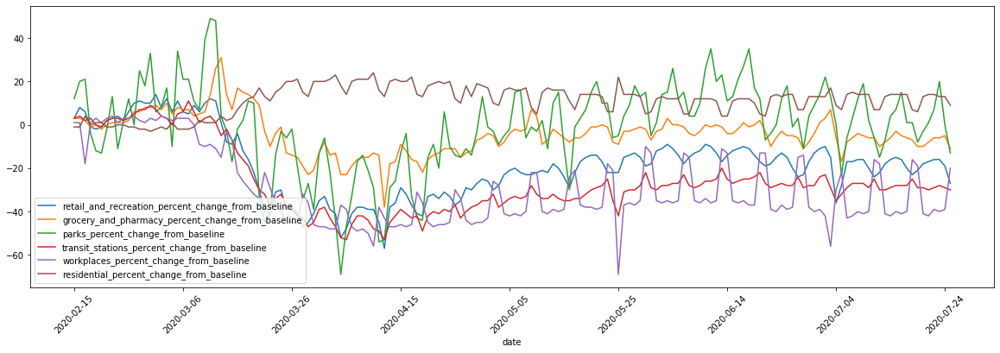

In [36]:
# graph Texas
tx_mobility_df = state_mobility_df[state_mobility_df['sub_region_1'] == 'Texas']
tx_mobility_df.plot(x='date', figsize=(20,6))
plt.xticks(rotation=45)
plt.show()

In [37]:
# use merge to join dataset to see when states reopened
state_merged_df = state_mobility_df.merge(reopen_df, left_on='sub_region_1', right_on='state')
# not sure if merge is needed
state_merged_df.shape

(8262, 27)

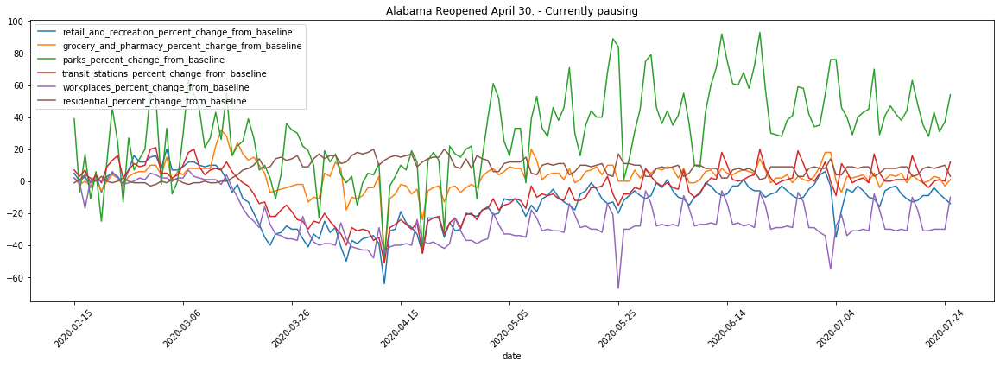

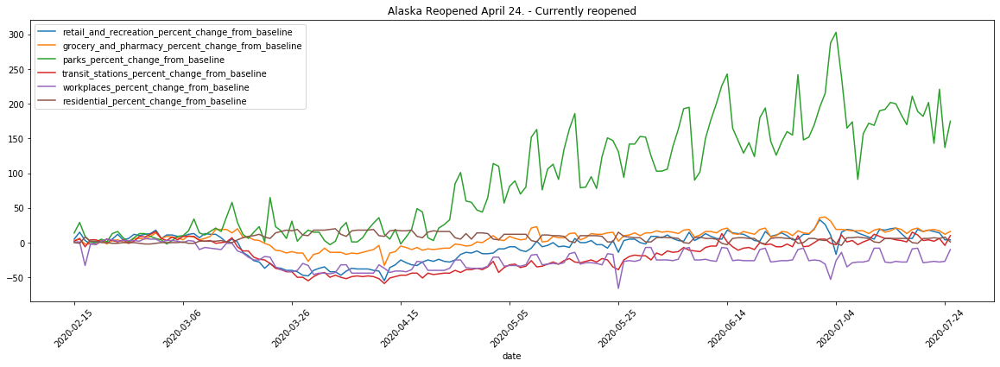

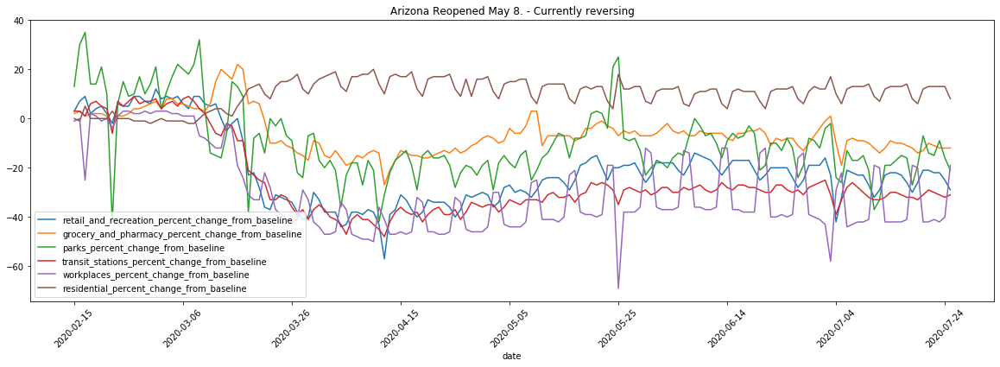

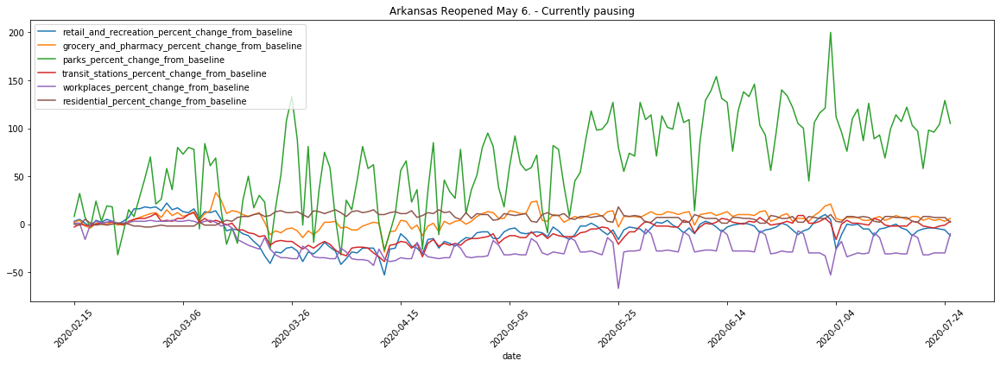

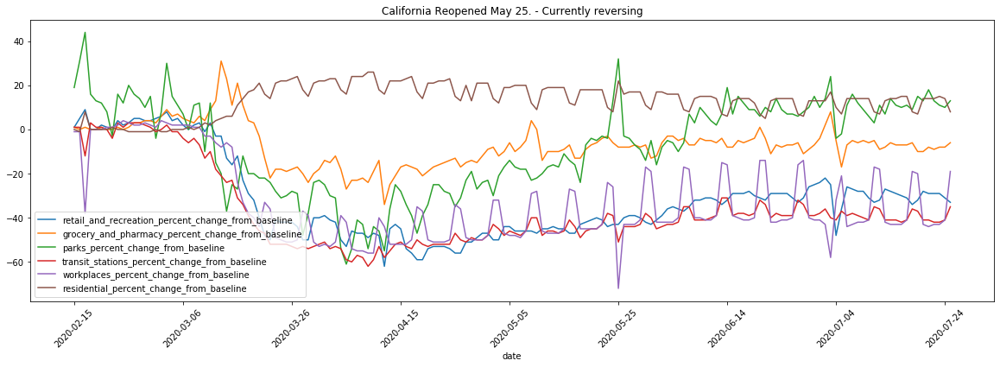

...

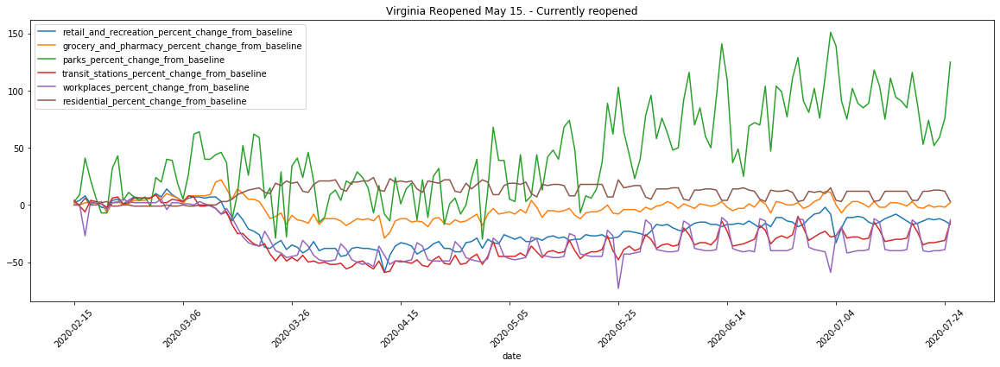

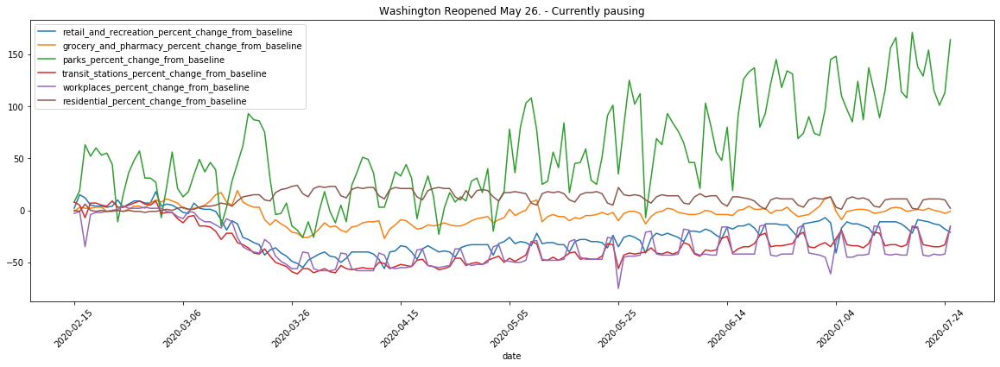

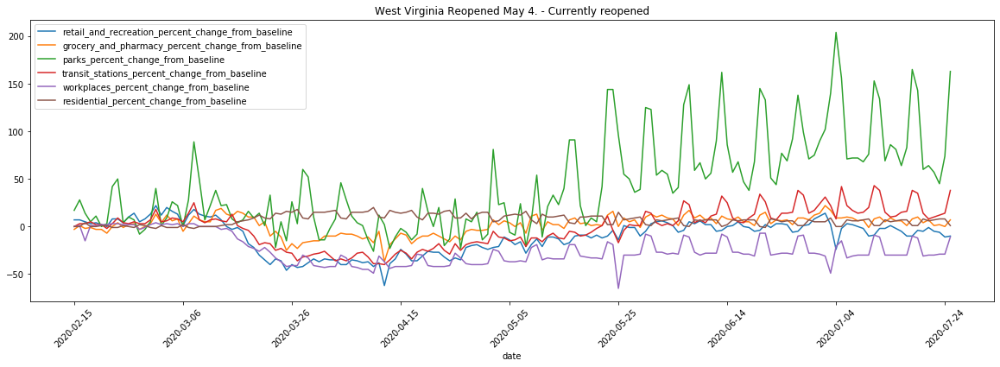

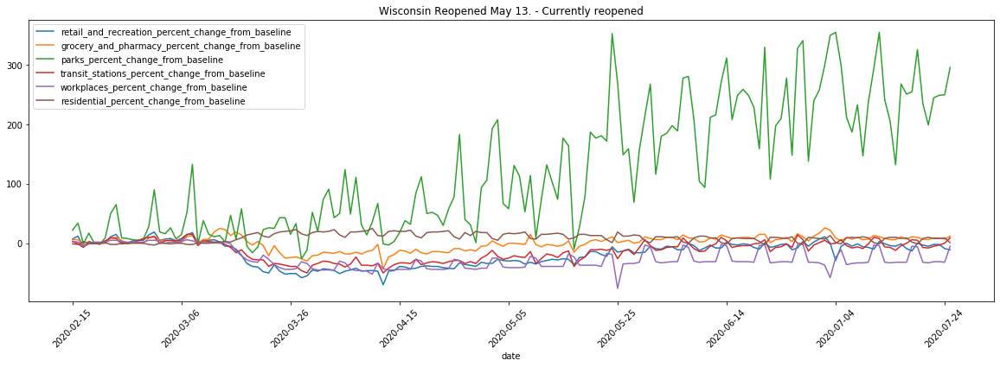

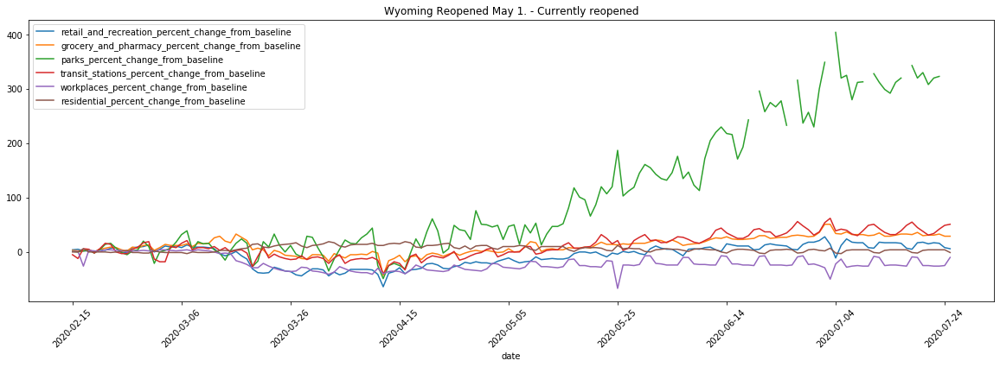

In [38]:
# display line chart for each state; not using merged dataset
for state in state_mobility_df['sub_region_1'].drop_duplicates():
    state_status = reopen_df[reopen_df['state'] == state][['date_details', 'status']]
    new_title = state + ' ' + state_status['date_details'].values[0] + ' - Currently ' + state_status['status'].values[0]
    each_state_df = state_mobility_df[state_mobility_df['sub_region_1'] == state]
    each_state_df.plot(x='date', figsize=(20,6), title= new_title)
    plt.xticks(rotation=45)
    plt.show()

Some states showed a clear change in mobility after the reopened date.

Would be interesting to see mobility chart next to the number of positive cases for the state over time to see if there is any correlation; Need to look into this...

In [39]:
# A couple of states had null values shown in the line graph; Should these be converted to zeros?
#state_df=state_mobility_df[state_mobility_df['sub_region_1'] == 'Idaho']
state_df = state_mobility_df
state_df[state_df.isnull().any(axis=1)]

,sub_region_1,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
921969,Delaware,2020-04-25,-37.0,-16.0,NaN,-37.0,-30.0,11.0
921976,Delaware,2020-05-02,-32.0,-11.0,NaN,-26.0,-28.0,10.0
921983,Delaware,2020-05-09,-31.0,0.0,NaN,-37.0,-25.0,11.0
921990,Delaware,2020-05-16,-29.0,-7.0,NaN,-28.0,-23.0,8.0
921997,Delaware,2020-05-23,-28.0,-4.0,NaN,-30.0,-19.0,9.0
922004,Delaware,2020-05-30,-25.0,-3.0,NaN,-15.0,-12.0,7.0
922010,Delaware,2020-06-05,-16.0,-2.0,NaN,-32.0,-37.0,14.0
922011,Delaware,2020-06-06,-12.0,5.0,NaN,-20.0,-10.0,5.0
922017,Delaware,2020-06-12,-8.0,3.0,NaN,-24.0,-35.0,11.0
922018,Delaware,2020-06-13,-5.0,8.0,NaN,-8.0,-7.0,3.0


Text(0.06, 0.5, '% Change')

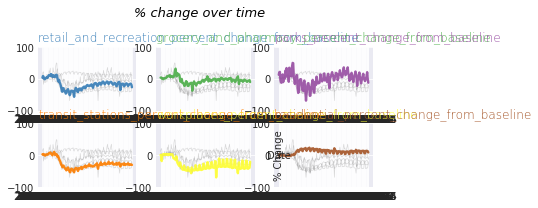

In [40]:
# make multiline graph for each set
# https://python-graph-gallery.com/125-small-multiples-for-line-chart/
tx_mobility_df = state_mobility_df[state_mobility_df['sub_region_1'] == 'Texas']
# Initialize the figure
plt.style.use('seaborn-darkgrid')
 
# create a color palette
palette = plt.get_cmap('Set1')
 
# multiple line plot
num=0
for column in tx_mobility_df.drop(['sub_region_1','date'], axis=1):
    num+=1
 
    # Find the right spot on the plot
    plt.subplot(3,3, num)
 
    # plot every groups, but discreet
    for v in tx_mobility_df.drop(['sub_region_1','date'], axis=1):
        plt.plot(tx_mobility_df['date'], tx_mobility_df[v], marker='', color='grey', linewidth=0.6, alpha=0.3)
 
    # Plot the lineplot
    plt.plot(tx_mobility_df['date'], tx_mobility_df[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)
 
    # Same limits for everybody!
    #plt.xlim(0,10)
    plt.ylim(-100,100)
 
    # Not ticks everywhere
    if num in range(7) :
        plt.tick_params(labelbottom='off')
    if num not in [1,4,7] :
        plt.tick_params(labelleft='off')
 
    # Add title
    plt.title(column, loc='left', fontsize=12, fontweight=0, color=palette(num) )
 
# general title
plt.suptitle("% change over time", fontsize=13, fontweight=0, color='black', style='italic', y=1.02)
 
# Axis title
plt.text(0.5, 0.02, 'Date', ha='center', va='center')
plt.text(0.06, 0.5, '% Change', ha='center', va='center', rotation='vertical')


Text(0.5, 1.02, '% Change over Time')

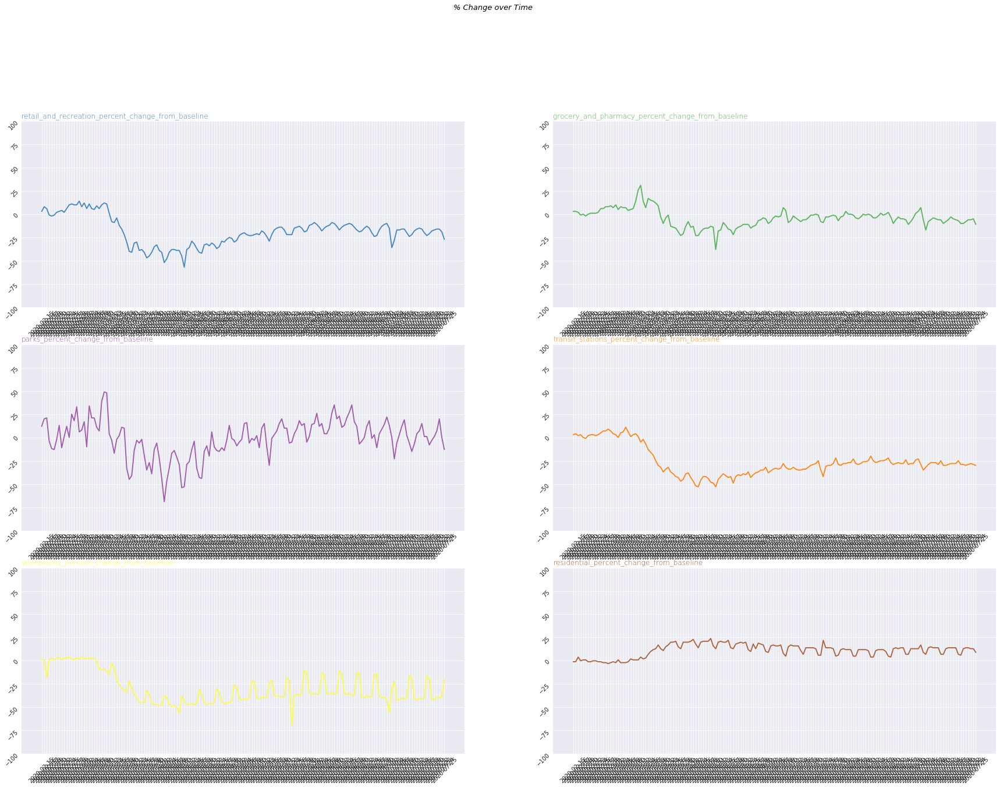

In [41]:
# make line graph set for each state
# https://python-graph-gallery.com/125-small-multiples-for-line-chart/
tx_mobility_df = state_mobility_df[state_mobility_df['sub_region_1'] == 'Texas']

# Initialize the figure
plt.style.use('seaborn-darkgrid')

plt.figure(figsize=(30,20))
 
# create a color palette
palette = plt.get_cmap('Set1')
 
# multiple line plot
num=0
for column in tx_mobility_df.drop(['sub_region_1','date'], axis=1):
    num+=1
 
    # Find the right spot on the plot
    plt.subplot(3,2, num)
 
    # Plot the lineplot
    plt.plot(tx_mobility_df['date'], tx_mobility_df[column], marker='', color=palette(num), linewidth=1.9, alpha=0.9, label=column)
 
    # Same limits for everybody!
    #plt.xlim(0,10)
    plt.ylim(-100,100)
    plt.tick_params(labelrotation=45)
    # Not ticks everywhere
    #if num in range(5) :
    #    plt.tick_params(labelbottom='off', labelrotation=45)
    #if num not in [1,4,7] :
     #   plt.tick_params(labelleft='off')
 
    # Add title
    plt.title(column, loc='left', fontsize=12, fontweight=0, color=palette(num) )
 
# general title
plt.suptitle("% Change over Time", fontsize=13, fontweight=0, color='black', style='italic', y=1.02)
 
# Axis title
#plt.text(0.5, 0.02, 'Date', ha='center', va='center')
#plt.text(0.06, 0.5, '% Change', ha='center', va='center', rotation='vertical')


Need to factor in rate of infection

Need to balance data?  If so, how to balance time-series?